In [55]:
import os

test_dataset = '/content/Acne-21/test'
val_dataset = '/content/Acne-21/valid'
train_dataset = '/content/Acne-21/train'

!pip install roboflow
from dotenv import load_dotenv
from roboflow import Roboflow
load_dotenv()
rf = Roboflow(api_key=os.getenv("ROBOFLOW_API_KEY"))
project = rf.workspace("kritsakorn").project("acne-kbm0q")
version = project.version(21)
dataset = version.download("voc")
# project = rf.workspace("acne-mdodj").project("acne-mz8ar")
# version = project.version(2)
# dataset = version.download("voc")

loading Roboflow workspace...
loading Roboflow project...


In [58]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.nn.init as init
from transformers import Dinov2Model, Dinov2Config




class MyLayerNorm(nn.Module):
    def __init__(self, normalized_shape):
        super(MyLayerNorm, self).__init__()
        self.norm = nn.LayerNorm(normalized_shape, eps=1e-6)

    def forward(self, x):
        # x is expected to be 4D with shape [batch_size, channels, height, width]
        # B, C, H, W = x.shape
        # Flatten the spatial dimensions, apply LayerNorm, and then restore the original shape
        # x = x.permute(0, 2, 3, 1).contiguous().view(B, H * W, C)
        x = self.norm(x)
        # x = x.view(B, H, W, C).permute(0, 3, 1, 2).contiguous()
        return x


class SegmentationHead(nn.Module):
    def __init__(self, num_features, num_classes):
        super(SegmentationHead, self).__init__()
        self.conv = nn.Conv2d(num_features, num_classes, kernel_size=1)

    def forward(self, x):
        x = self.conv(x)
        return x


class DinoSegmentationModel(nn.Module):
    def __init__(self, num_classes, dropout_rate=0.0):
        super(DinoSegmentationModel, self).__init__()
        self.backbone = torch.hub.load('facebookresearch/dinov2', 'dinov2_vits14', pretrained=True)
        self.num_classes = num_classes
        self.dropout = nn.Dropout(dropout_rate)

        # Assuming the feature map has a shape [batch_size, 384, height, width]
        self.linear_classifier_head = LinearClassifierHead(384, num_classes)
        self.custom_norm = MyLayerNorm(normalized_shape=(384, 16, 16))

    def forward(self, x):
        features = self.backbone.get_intermediate_layers(x, n=1, reshape=True)[0]
        features = self.custom_norm(features)
        features = self.dropout(features)
        logits = self.linear_classifier_head(features)
        logits_upsampled = F.interpolate(logits, size=(224, 224), mode='bilinear', align_corners=False)
        return logits_upsampled


class LinearClassifierHead(nn.Module):
    def __init__(self, num_features, num_classes):
        super(LinearClassifierHead, self).__init__()
        self.linear_classifier = nn.Conv2d(num_features, num_classes, kernel_size=1)

    def forward(self, x):
        return self.linear_classifier(x)


def initialize_weights(m):
    if isinstance(m, nn.Conv2d):
        # You can choose different types of init here based on the activation function you use
        # If you use ReLU activations after convolutions, kaiming_normal_ is a good method
        init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
        if m.bias is not None:
            init.constant_(m.bias, 0)
    elif isinstance(m, nn.BatchNorm2d):
        init.constant_(m.weight, 1)
        init.constant_(m.bias, 0)
    elif isinstance(m, nn.Linear):
        # For linear layers, normal or xavier initialization works well
        init.xavier_normal_(m.weight)
        init.constant_(m.bias, 0)


from torchvision import transforms
num_features = 384
class_dict = {
    'background':0,
    'dark spot':1,
    'blackheads':2,
    'whiteheads':3,
    'nodules':4,
    'pustules':5,
    'papules':6,
}
segmentation_head = SegmentationHead(num_features, num_classes=len(class_dict))
model = DinoSegmentationModel(num_classes=len(class_dict))
model.apply(initialize_weights)


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


DinoSegmentationModel(
  (backbone): DinoVisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 384, kernel_size=(14, 14), stride=(14, 14))
      (norm): Identity()
    )
    (blocks): ModuleList(
      (0-11): 12 x NestedTensorBlock(
        (norm1): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
        (attn): MemEffAttention(
          (qkv): Linear(in_features=384, out_features=1152, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=384, out_features=384, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (ls1): LayerScale()
        (drop_path1): Identity()
        (norm2): LayerNorm((384,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=384, out_features=1536, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=1536, out_features=384, bias=True)
          (drop): Dropout(p=0.0, inplace=False)


In [59]:
import os
import torch
from PIL import Image
from torchvision import transforms
from torchvision.transforms import functional as TF
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
import xml.etree.ElementTree as ET
import numpy as np
from tqdm import tqdm
import torch.nn as nn
import torch.nn.init as init

class SegmentationDataset(Dataset):
    def __init__(self, root_dir, class_dict, image_transform=None, mask_transform=None):
        """
        Args:
            root_dir (string): Directory with all the images and XML files.
            transform (callable, optional): Optional transform to be applied on a sample.
        """
        if (image_transform == None):
          image_transform = transforms.Compose([
                transforms.Resize(256),
                transforms.CenterCrop(224),
                transforms.ToTensor(),
          ])

        if(mask_transform == None):
          mask_transform = transforms.Compose([
              transforms.Resize(256, interpolation=Image.NEAREST),
              transforms.CenterCrop(224),
          ])

        self.root_dir = root_dir
        self.image_transform = image_transform
        self.mask_transform = mask_transform
        self.class_dict = class_dict
        self.image_paths = [os.path.join(root_dir, x) for x in os.listdir(root_dir) if x.endswith('.jpg') and os.path.exists(os.path.join(root_dir, x.replace('.jpg', '.xml')))]
    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        xml_path = img_path.replace('.jpg', '.xml')
        image = Image.open(img_path).convert('RGB')
        mask = self._load_mask_from_xml(xml_path, image.size)

        image = self.image_transform(image)
        # mask = self.transform(mask)
        # mask = TF.resize(mask, (224, 224), interpolation=Image.NEAREST)  # Resize the mask with nearest neighbor
        mask = self.mask_transform(mask)
        # mask = np.array(mask).squeeze()
        # unq = np.unique(mask)
        mask = np.array(mask, dtype=np.uint8)
        mask = torch.from_numpy(mask).long()  # Convert to LongTensor for cross-entropy





        return image, mask


    def _load_mask_from_xml(self, xml_path, img_shape):
      class_dict=self.class_dict
      tree = ET.parse(xml_path)
      root = tree.getroot()
      # print(xml_path)

      # Initialize a mask with zeros (background)
      mask = np.zeros((img_shape[1], img_shape[0]), dtype=np.uint8)  # Note the shape order

      # Iterate over each object in the XML
      for obj in root.findall('object'):
          class_name = obj.find('name').text
          class_id = class_dict[class_name]

          # Extract bounding box coordinates
          bndbox = obj.find('bndbox')
          xmin = int(bndbox.find('xmin').text)
          xmax = int(bndbox.find('xmax').text)
          ymin = int(bndbox.find('ymin').text)
          ymax = int(bndbox.find('ymax').text)

          # Assign class_id to pixels within the bounding box
          mask[ymin:ymax, xmin:xmax] = class_id
          mask = mask.astype(np.uint8)


      # Convert mask to a PIL image
      return Image.fromarray(mask)



# Instantiate the datasets
train_dataset = SegmentationDataset(root_dir='/content/Acne-21/train', class_dict=class_dict)
val_dataset = SegmentationDataset(root_dir='/content/Acne-21/valid', class_dict=class_dict)
test_dataset = SegmentationDataset(root_dir='/content/Acne-21/test', class_dict=class_dict)

# Create the dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True, num_workers=2)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=2)

i = 0
for inputs, mask in tqdm(train_loader):
  # if i == 96:
  #   print(train_dataset.image_paths[i])
  #   print(np.unique(mask))
  # i+=1
  pass



dataloaders = {'train': train_loader, 'val': val_loader, 'test':test_loader}


100%|██████████| 121/121 [00:04<00:00, 29.59it/s]


In [ ]:
# # Use the same dummy data setup as before
# dummy_img = torch.randn(8, 3, 224, 224)  # Batch size of 8
# model.eval()  # Make sure the model is in evaluation mode

# # Pass the dummy data through the backbone and each subsequent layer
# with torch.no_grad():
#     backbone_features = model.backbone.get_intermediate_layers(dummy_img, n=1, reshape=True)[0]
#     print("Backbone output shape:", backbone_features.shape)

#     norm_features = model.custom_norm(backbone_features)
#     print("After custom norm layer shape:", norm_features.shape)

#     # If the above shapes are correct, proceed with the next layer
#     seg_head_output = model.segmentation_head(norm_features)
#     print("After segmentation head shape:", seg_head_output.shape)

#     # Final upsampling
#     upsampled_output = F.interpolate(seg_head_output, size=(224,224), mode='bilinear', align_corners=False)
#     print("Final upsampled output shape:", upsampled_output.shape)

# Create the dummy data
dummy_img = torch.randn(8, 3, 224, 224)  # Batch size of 8, assuming the input image is 224x224 with 3 channels
dummy_labels = torch.randint(0, len(class_dict), (8, 224, 224))  # Randomly generate some labels

# Make sure the model is in evaluation mode
model.eval()

# Pass the dummy data through the model
with torch.no_grad():
    logits_upsampled = model(dummy_img)



/content/Acne-21/train/levle0_527_jpg.rf.29c25678bb74593523c68a85d57338f1.jpg


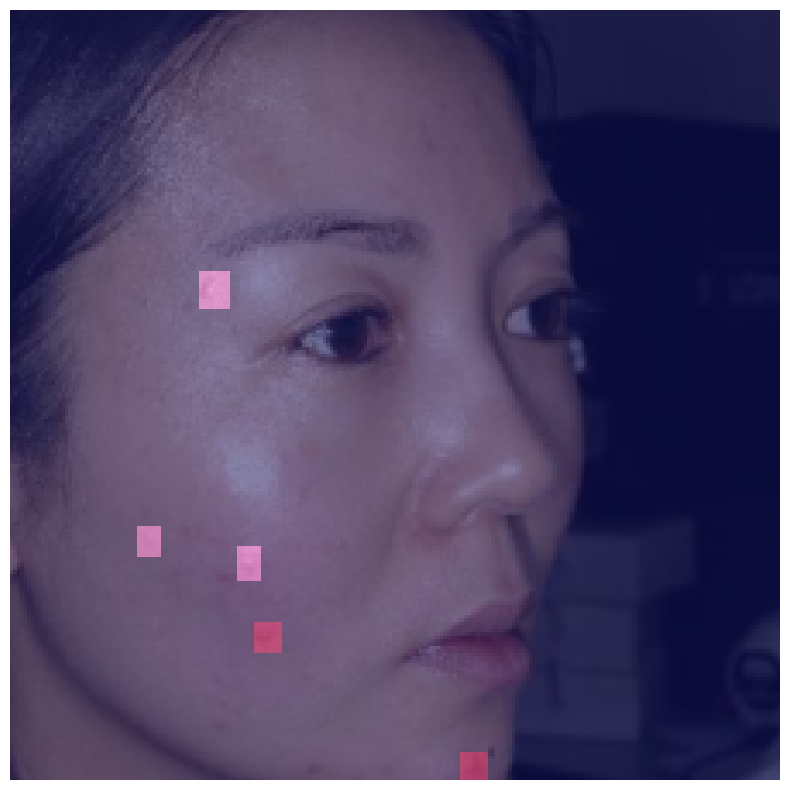

In [60]:
import torch
import numpy as np
import matplotlib.pyplot as plt

# map every class to a random color
id2label = {
    0: 'background',
    1: 'dark spot',
    2: 'blackheads',
    3: 'whiteheads',
    4: 'nodules',
    5: 'pustules',
    6: 'papules',
}


id2color = {k: list(np.random.choice(range(256), size=3)) for k, v in id2label.items()}

# Assuming 'train_dataset' is defined and has a method 'image_paths' and __getitem__
image_n = 100
image, mask = train_dataset[image_n]
print(train_dataset.image_paths[image_n])

def visualize_map(image, segmentation_map):
    # Assuming the segmentation map is a 4D tensor [batch_size, 1, height, width]
    segmentation_map = segmentation_map.squeeze()  # Remove the channel dimension
    if image.shape[0] == 3:  # assuming 3 channels
        image = image.permute(1, 2, 0)  # Convert from CHW to HWC
        image = (image * 255).type(torch.uint8).numpy()  # Convert to numpy array

    # Prepare the color overlay
    color_seg = np.zeros((segmentation_map.shape[0], segmentation_map.shape[1], 3), dtype=np.uint8)
    for label, color in id2color.items():
        color_seg[segmentation_map == label] = color

    # Combine the image with the color overlay
    alpha = 0.5  # Transparency for the overlay
    img = (1 - alpha) * image + alpha * color_seg
    img = img.astype(np.uint8)

    # Show image + mask
    plt.figure(figsize=(15, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.show()
visualize_map(image, mask)

In [ ]:
# class SegmentationModelWithLinearClassifier(nn.Module):
#     def __init__(self, base_model, num_features, num_classes):
#         super(SegmentationModelWithLinearClassifier, self).__init__()
#         self.base_model = base_model  # Your existing model
#         self.linear_classifier = nn.Conv2d(num_features, num_classes, kernel_size=1)
#         # Initialize the linear classifier layer weights for better performance
#         nn.init.xavier_uniform_(self.linear_classifier.weight)
#         nn.init.zeros_(self.linear_classifier.bias)

#     def forward(self, x):
#         x = self.base_model(x)  # Pass input through the base model
#         print("Shape before linear classifier:", x.shape)
#         x = self.linear_classifier(x)  # Apply linear classifier on top
#         return x

# num_features = 224
# num_classes = 7  # Adjust based on your dataset's classes
# extended_model = SegmentationModelWithLinearClassifier(model, num_features, num_classes)

In [26]:
from collections import Counter

def calculate_class_distribution(dataloader):
    counter = Counter()

    for _, mask in dataloader:
        masks_np = mask.numpy()
        counts = Counter(masks_np.flatten())  # Count the occurrence of each class label in the mask
        counter.update(counts)

    # Normalize by the total number of pixels to get frequency
    total_pixels = sum(counter.values())
    class_frequencies = {class_id: count / total_pixels for class_id, count in counter.items()}
    return class_frequencies

class_distribution = calculate_class_distribution(train_loader)
print(class_distribution)

{0: 0.9698266037296129, 6: 0.008080521368096928, 1: 0.009426074874825706, 4: 0.003356281128522838, 3: 0.0026207748724489796, 5: 0.0042799243144462755, 2: 0.002409819712046309}


CLASS WEIGHTS:  tensor([ 0.1473, 15.1555, 59.2813, 54.5095, 42.5641, 33.3784, 17.6792],
       device='cuda:0')
Epoch 0/24
----------


100%|██████████| 121/121 [00:17<00:00,  7.02it/s]


train Loss: 5.4586 IoU: 0.0639


100%|██████████| 25/25 [00:01<00:00, 15.79it/s]


val Loss: 2.5237 IoU: 0.0376
Visualizing predictions from epoch 0


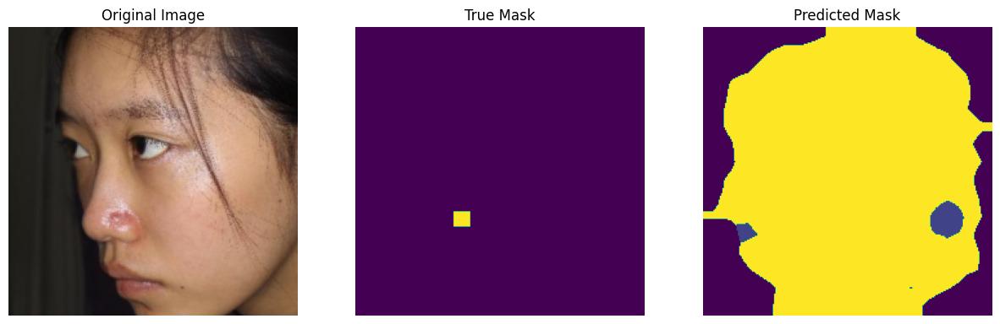

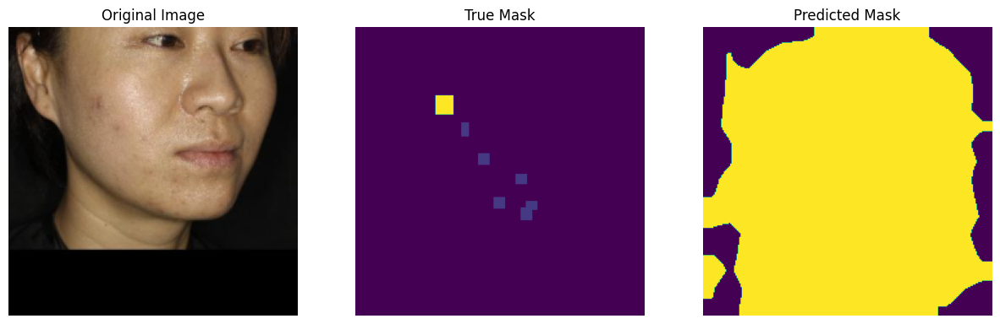


Epoch 1/24
----------


100%|██████████| 121/121 [00:17<00:00,  7.06it/s]


train Loss: 2.8682 IoU: 0.0699


100%|██████████| 25/25 [00:02<00:00,  8.40it/s]


val Loss: 2.4438 IoU: 0.0960
Visualizing predictions from epoch 1


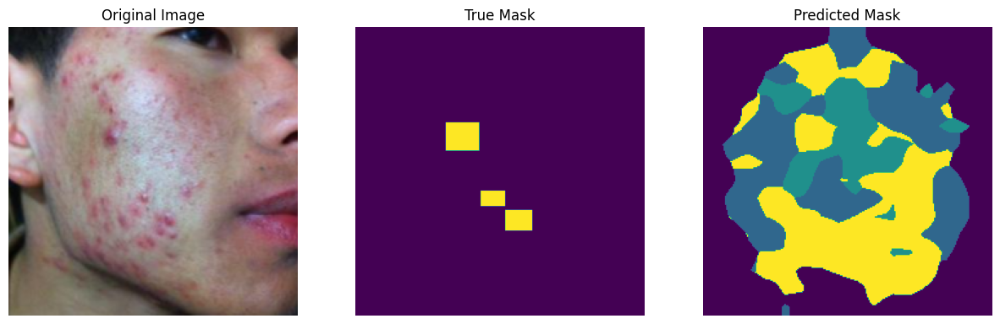

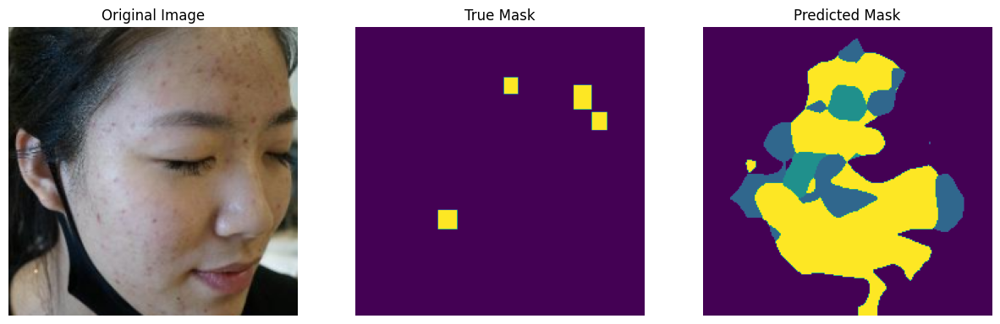


Epoch 2/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.86it/s]


train Loss: 2.4048 IoU: 0.0833


100%|██████████| 25/25 [00:01<00:00, 15.81it/s]


val Loss: 2.0547 IoU: 0.1422
Visualizing predictions from epoch 2


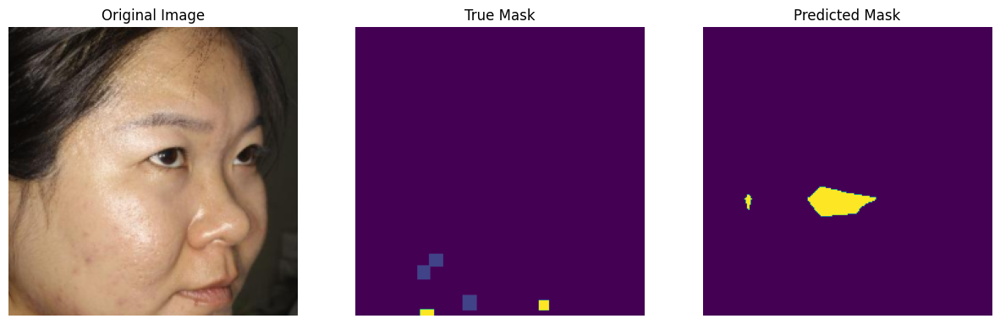

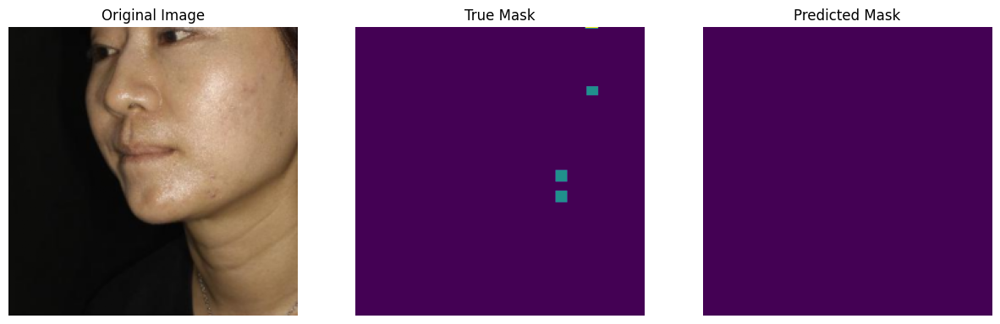


Epoch 3/24
----------


100%|██████████| 121/121 [00:17<00:00,  7.07it/s]


train Loss: 2.3413 IoU: 0.0901


100%|██████████| 25/25 [00:02<00:00, 11.53it/s]


val Loss: 2.4120 IoU: 0.1601
Visualizing predictions from epoch 3


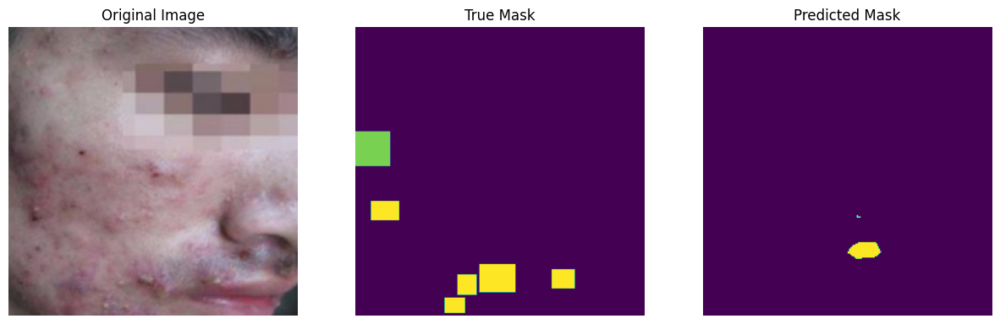

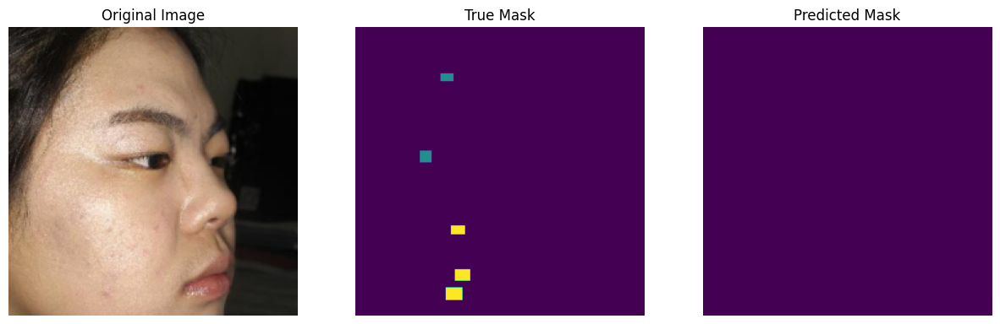


Epoch 4/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.94it/s]


train Loss: 1.7235 IoU: 0.1181


100%|██████████| 25/25 [00:01<00:00, 14.73it/s]


val Loss: 1.5560 IoU: 0.1284
Visualizing predictions from epoch 4


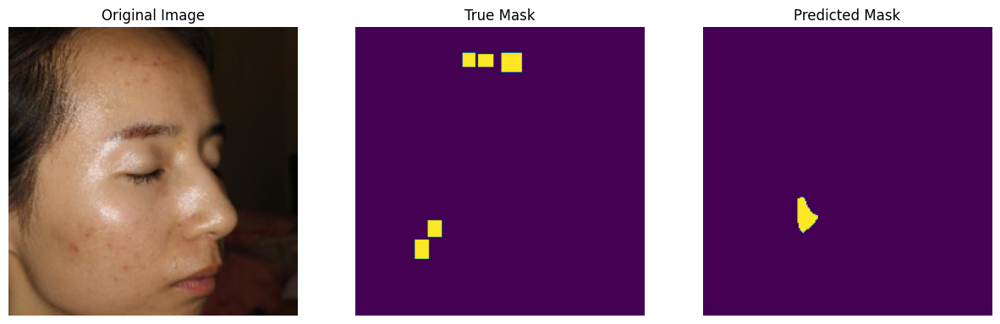

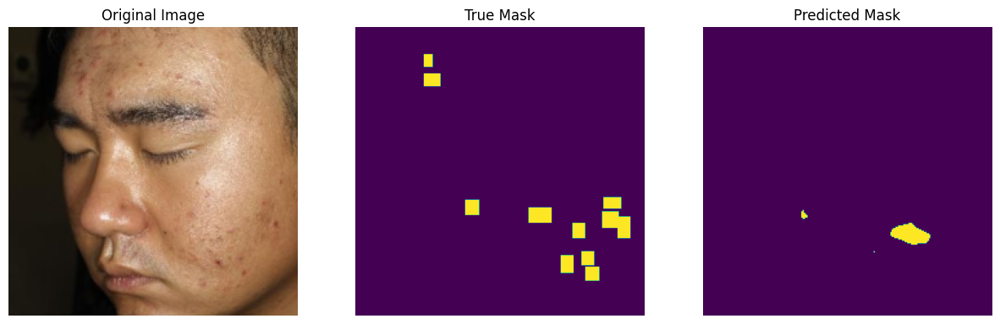


Epoch 5/24
----------


100%|██████████| 121/121 [00:19<00:00,  6.34it/s]


train Loss: 1.6452 IoU: 0.1213


100%|██████████| 25/25 [00:01<00:00, 14.55it/s]


val Loss: 1.6816 IoU: 0.1146
Visualizing predictions from epoch 5


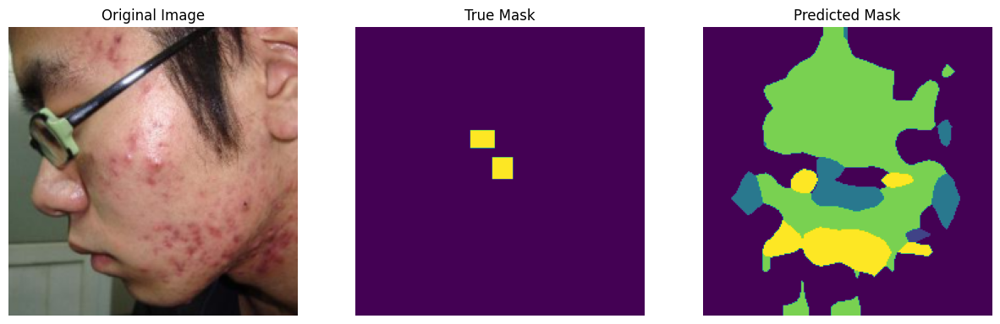

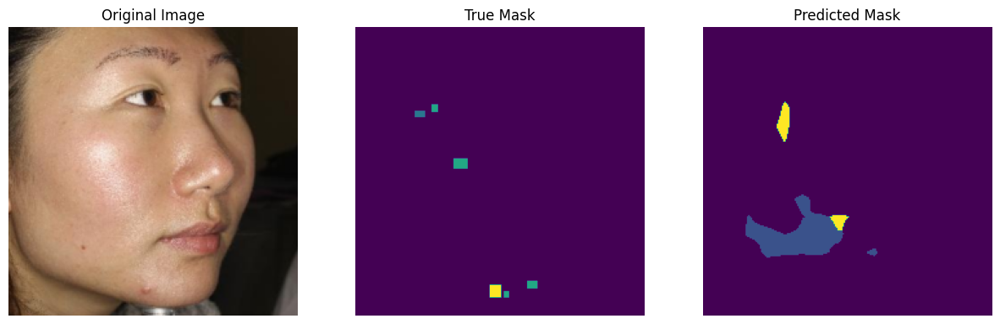


Epoch 6/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.98it/s]


train Loss: 1.6583 IoU: 0.1162


100%|██████████| 25/25 [00:01<00:00, 14.52it/s]


val Loss: 1.5728 IoU: 0.1201
Visualizing predictions from epoch 6


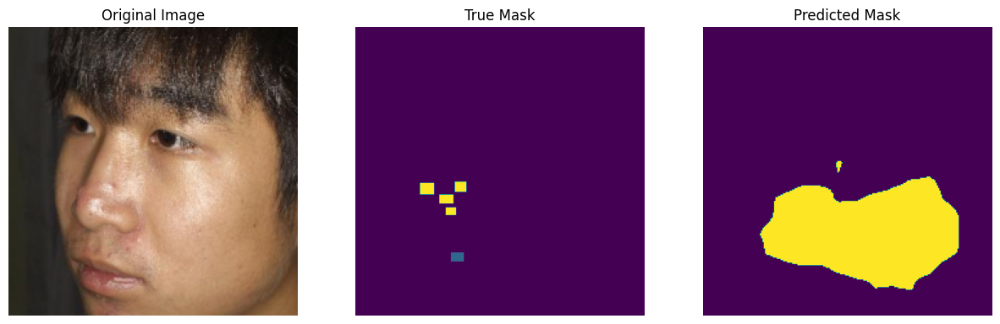

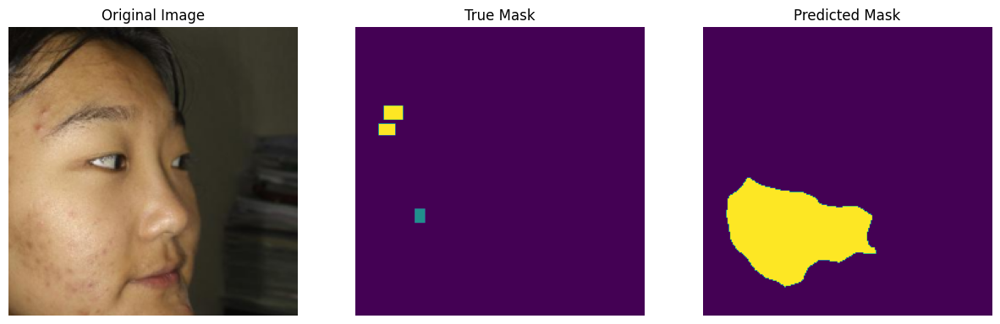


Epoch 7/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.85it/s]


train Loss: 1.6792 IoU: 0.1153


100%|██████████| 25/25 [00:01<00:00, 13.02it/s]


val Loss: 1.5729 IoU: 0.1164
Visualizing predictions from epoch 7


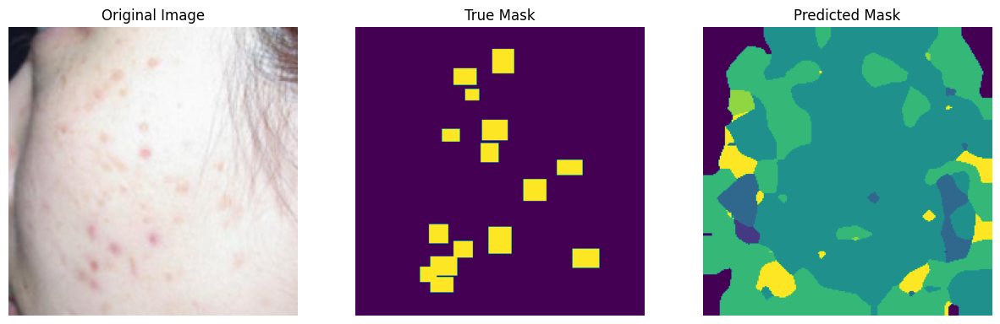

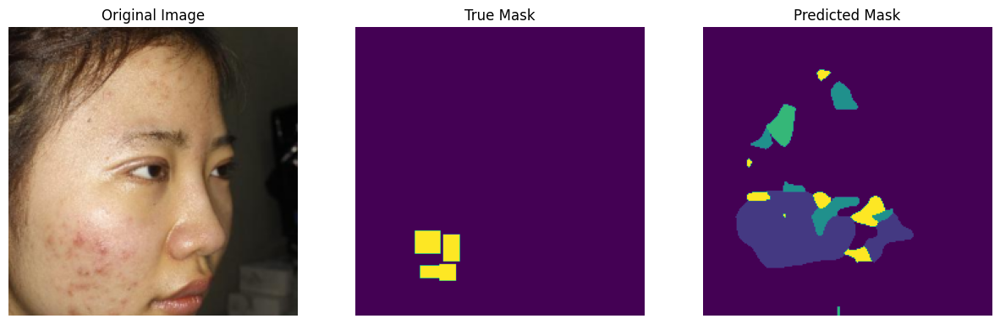


Epoch 8/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.93it/s]


train Loss: 1.6172 IoU: 0.1246


100%|██████████| 25/25 [00:01<00:00, 14.10it/s]


val Loss: 1.5442 IoU: 0.1243
Visualizing predictions from epoch 8


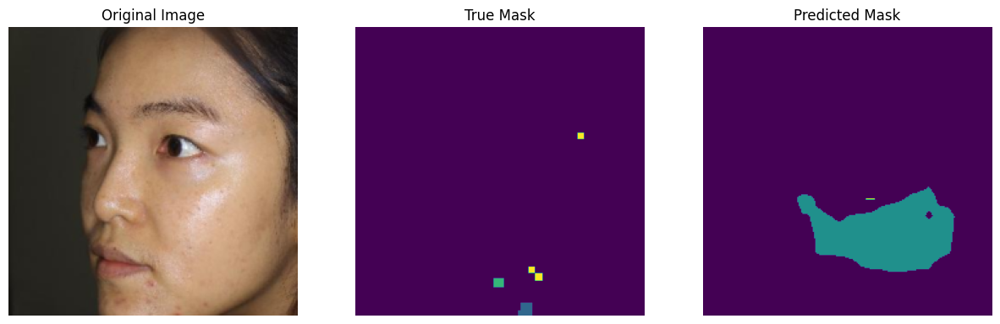

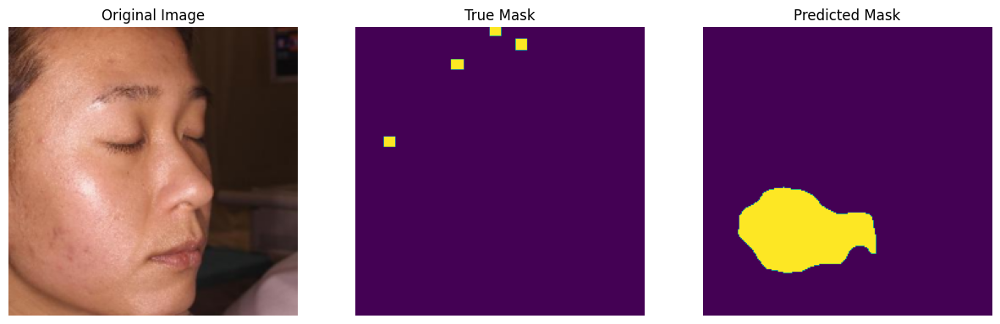


Epoch 9/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.90it/s]


train Loss: 1.6131 IoU: 0.1247


100%|██████████| 25/25 [00:01<00:00, 13.14it/s]


val Loss: 1.5505 IoU: 0.1248
Visualizing predictions from epoch 9


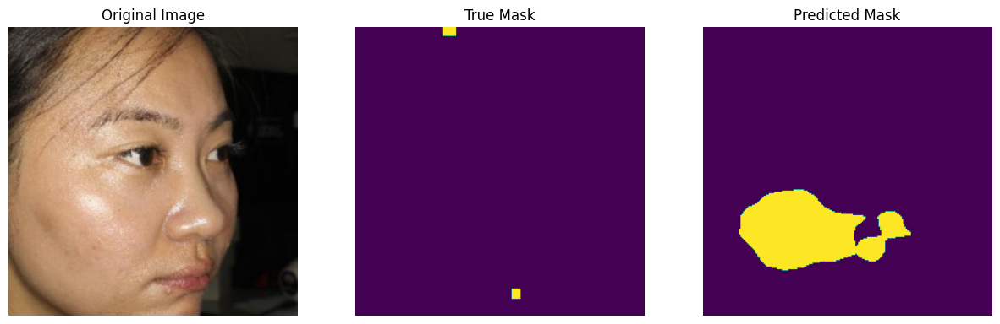

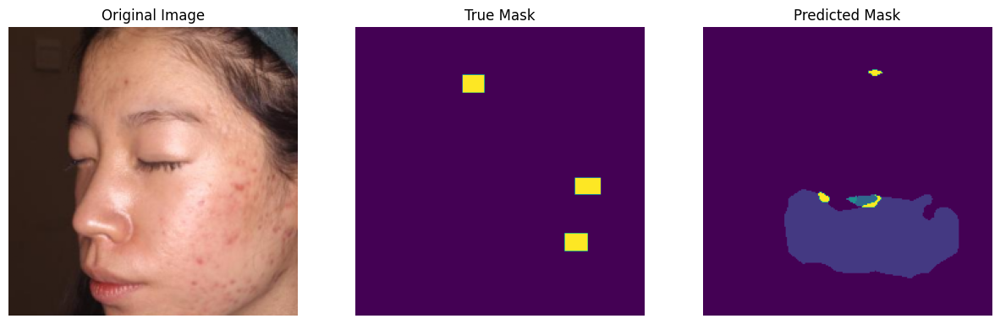


Epoch 10/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.85it/s]


train Loss: 1.6168 IoU: 0.1220


100%|██████████| 25/25 [00:02<00:00, 12.30it/s]


val Loss: 1.5465 IoU: 0.1255
Visualizing predictions from epoch 10


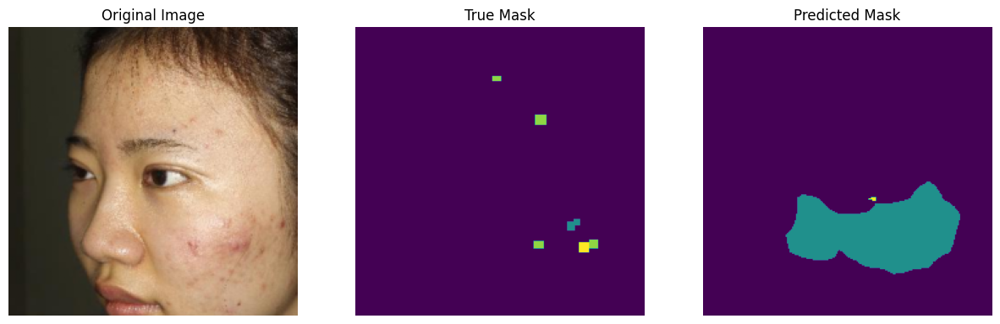

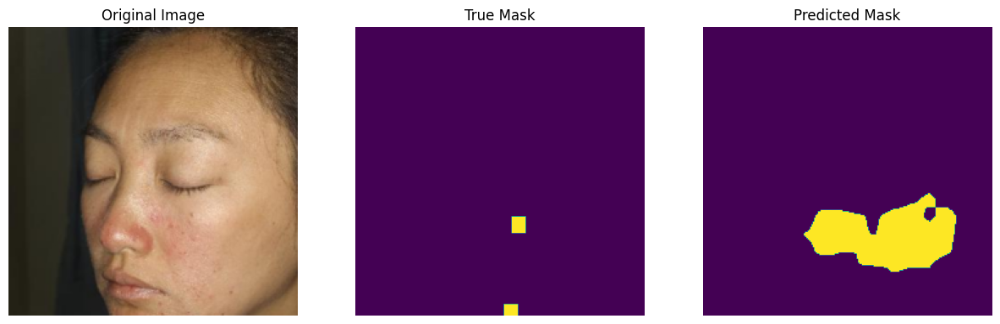


Epoch 11/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.82it/s]


train Loss: 1.6090 IoU: 0.1240


100%|██████████| 25/25 [00:02<00:00, 12.10it/s]


val Loss: 1.5626 IoU: 0.1225
Visualizing predictions from epoch 11


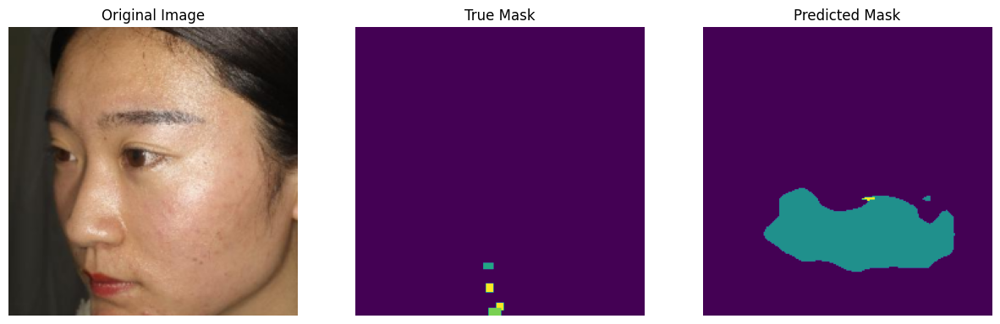

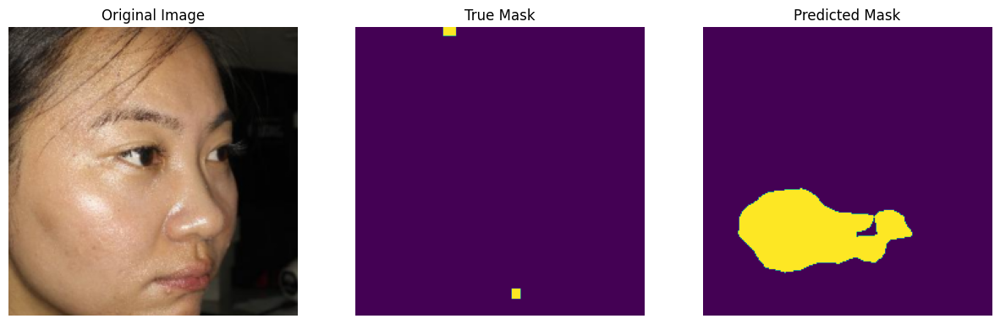


Epoch 12/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.50it/s]


train Loss: 1.5922 IoU: 0.1232


100%|██████████| 25/25 [00:01<00:00, 12.90it/s]


val Loss: 1.5529 IoU: 0.1237
Visualizing predictions from epoch 12


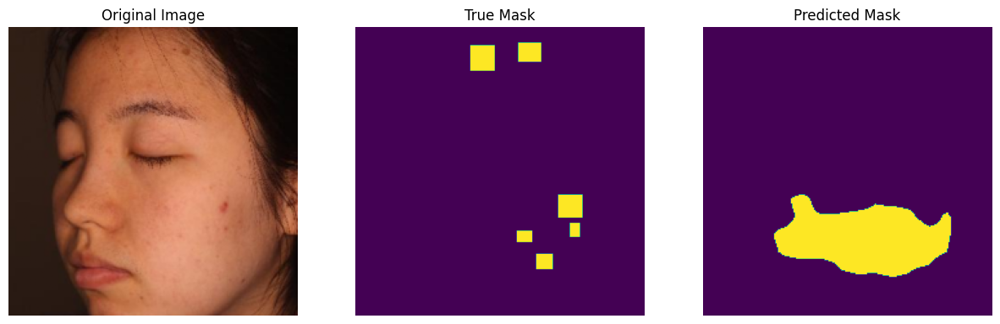

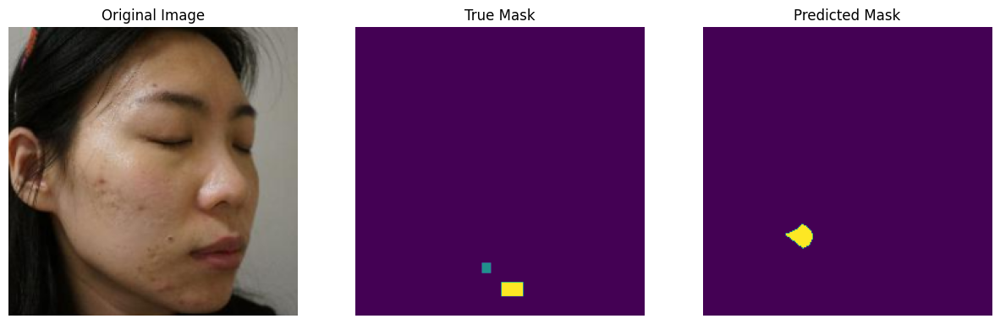


Epoch 13/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.77it/s]


train Loss: 1.5980 IoU: 0.1246


100%|██████████| 25/25 [00:02<00:00, 12.32it/s]


val Loss: 1.5466 IoU: 0.1242
Visualizing predictions from epoch 13


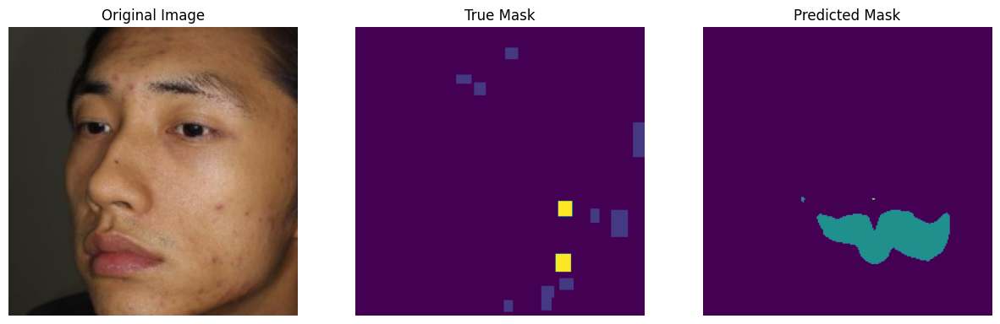

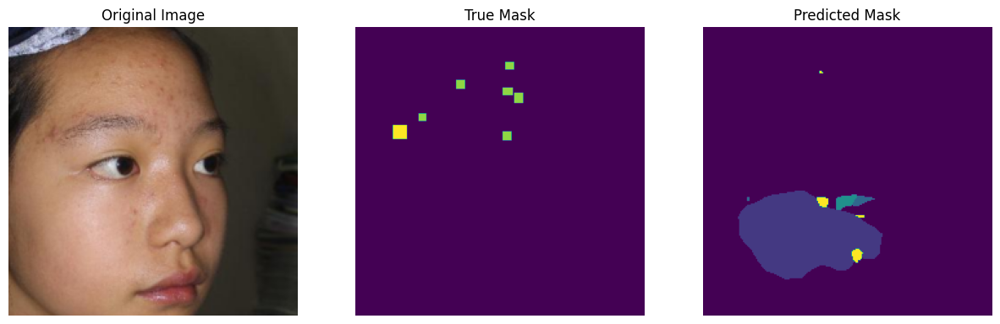


Epoch 14/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.86it/s]


train Loss: 1.5929 IoU: 0.1254


100%|██████████| 25/25 [00:01<00:00, 13.03it/s]


val Loss: 1.5433 IoU: 0.1245
Visualizing predictions from epoch 14


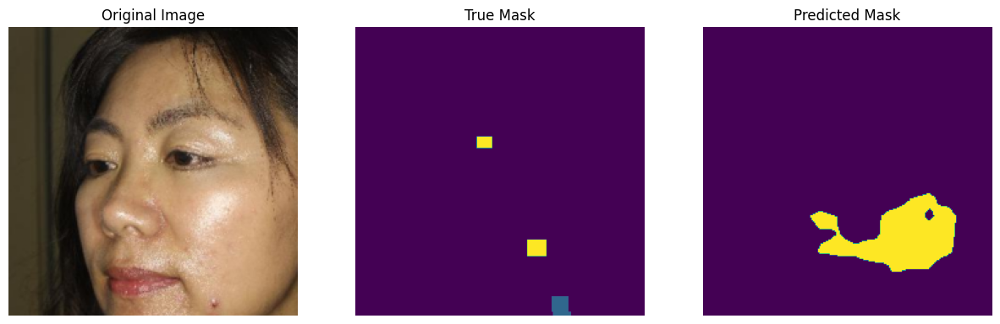

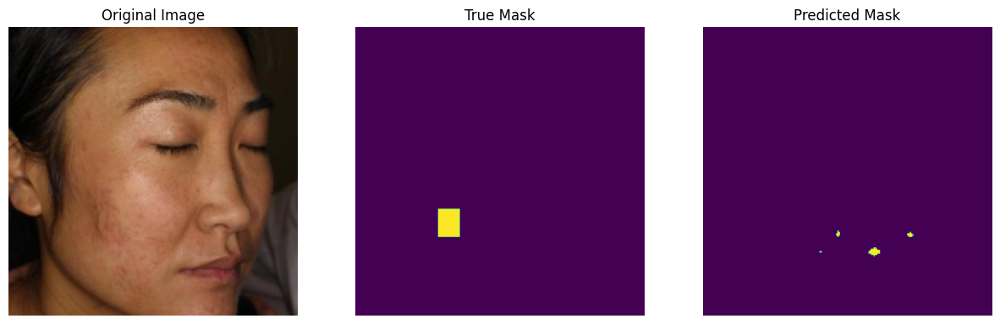


Epoch 15/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.65it/s]


train Loss: 1.6065 IoU: 0.1241


100%|██████████| 25/25 [00:02<00:00, 12.28it/s]


val Loss: 1.5440 IoU: 0.1237
Visualizing predictions from epoch 15


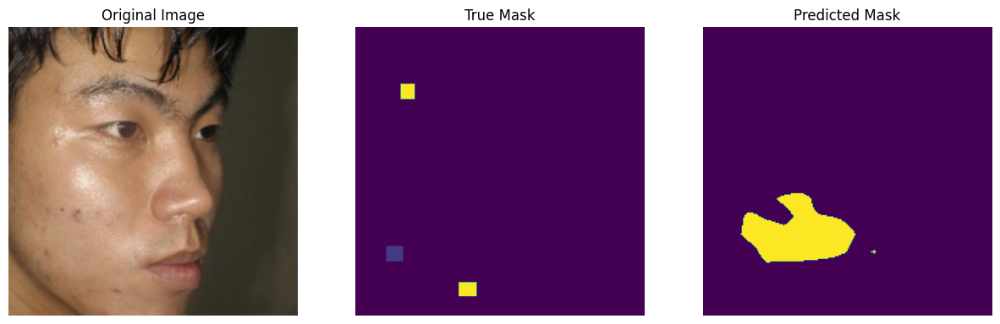

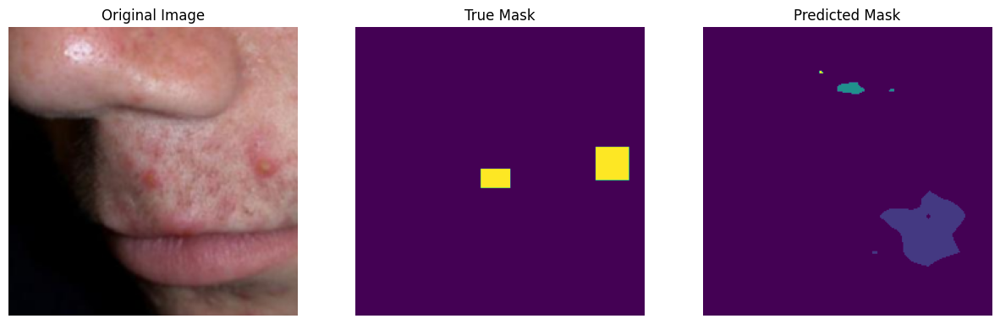


Epoch 16/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.87it/s]


train Loss: 1.6056 IoU: 0.1240


100%|██████████| 25/25 [00:02<00:00, 12.16it/s]


val Loss: 1.5440 IoU: 0.1237
Visualizing predictions from epoch 16


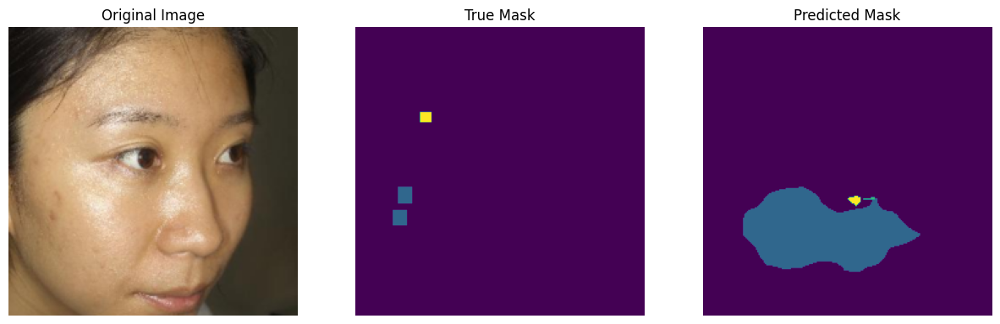

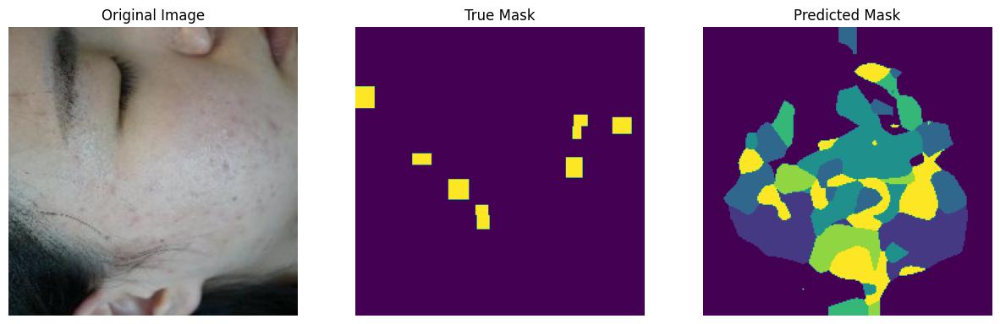


Epoch 17/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.83it/s]


train Loss: 1.6007 IoU: 0.1239


100%|██████████| 25/25 [00:02<00:00,  9.47it/s]


val Loss: 1.5437 IoU: 0.1238
Visualizing predictions from epoch 17


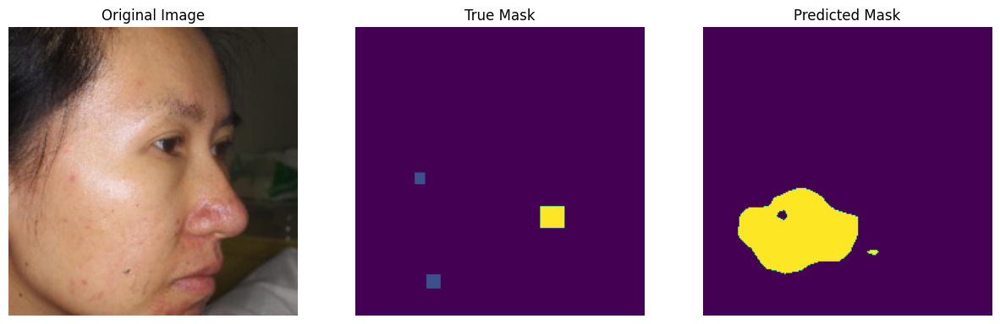

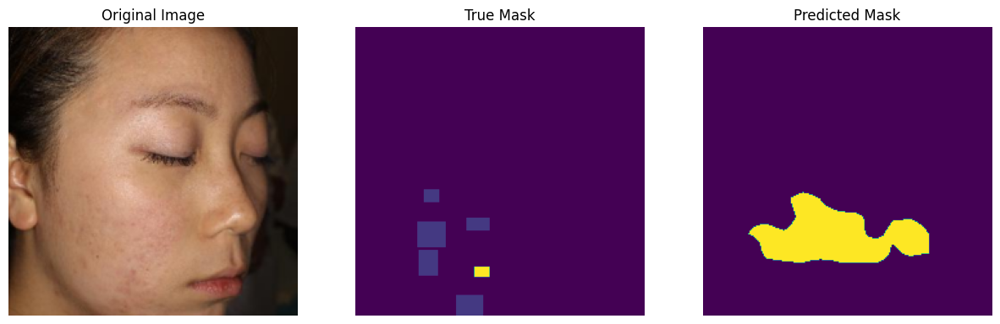


Epoch 18/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.83it/s]


train Loss: 1.5816 IoU: 0.1252


100%|██████████| 25/25 [00:02<00:00, 11.93it/s]


val Loss: 1.5435 IoU: 0.1238
Visualizing predictions from epoch 18


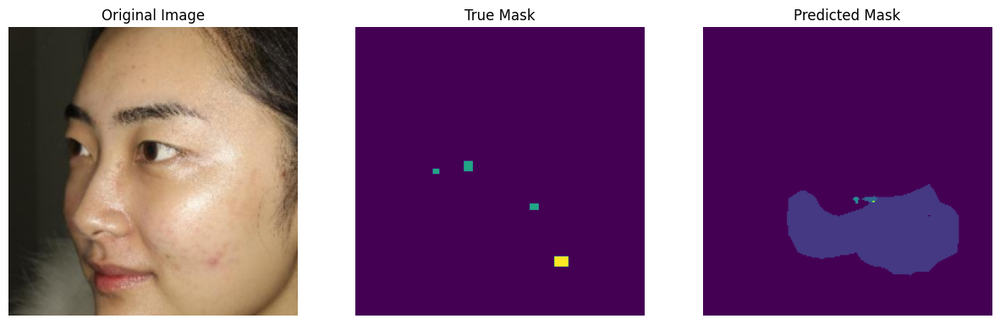

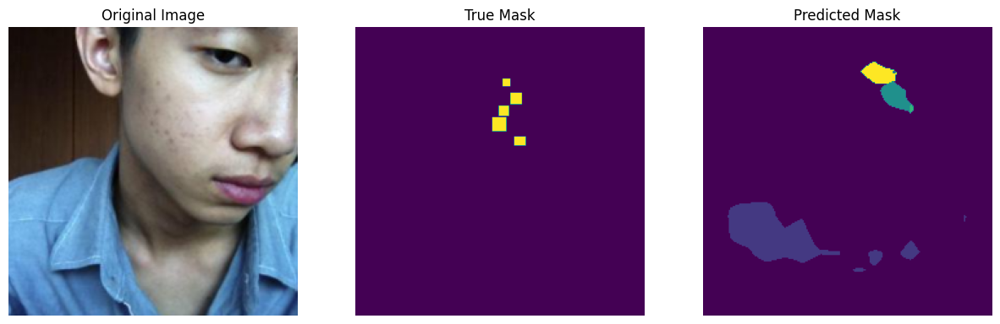


Epoch 19/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.70it/s]


train Loss: 1.6009 IoU: 0.1248


100%|██████████| 25/25 [00:02<00:00,  9.52it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 19


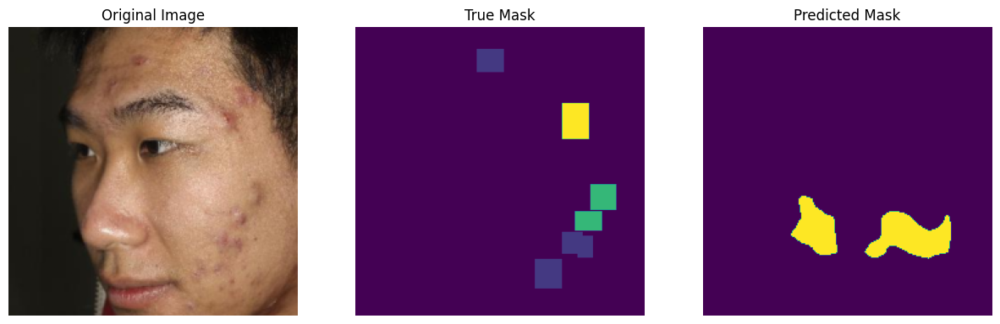

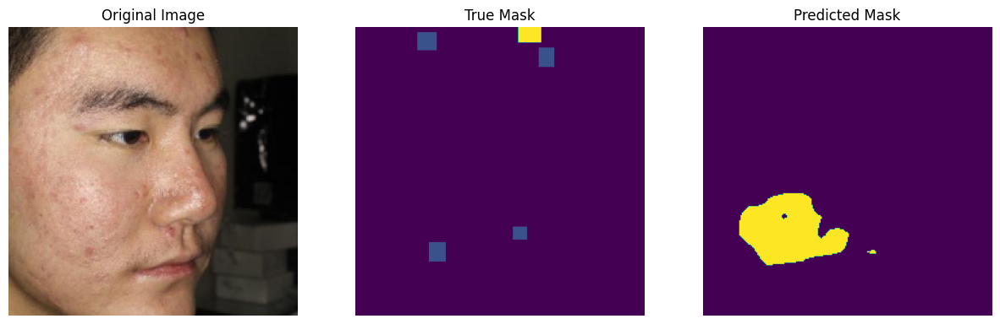


Epoch 20/24
----------


100%|██████████| 121/121 [00:17<00:00,  6.78it/s]


train Loss: 1.5956 IoU: 0.1235


100%|██████████| 25/25 [00:02<00:00, 11.51it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 20


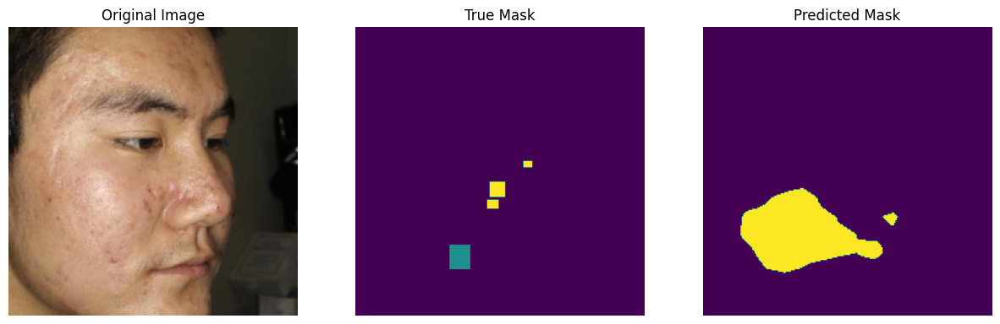

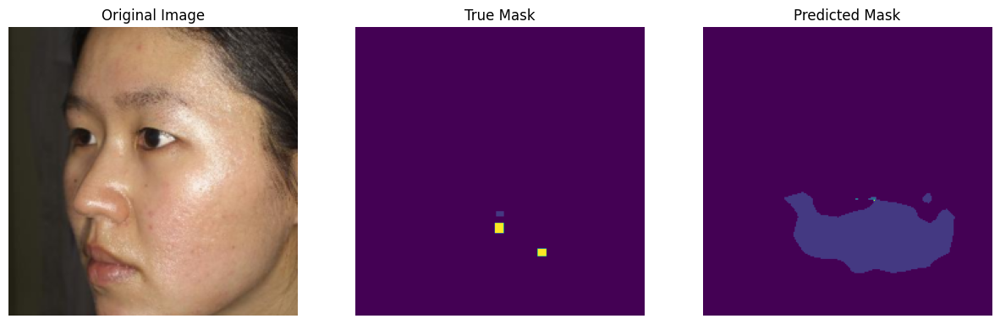


Epoch 21/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.59it/s]


train Loss: 1.6056 IoU: 0.1245


100%|██████████| 25/25 [00:02<00:00,  9.57it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 21


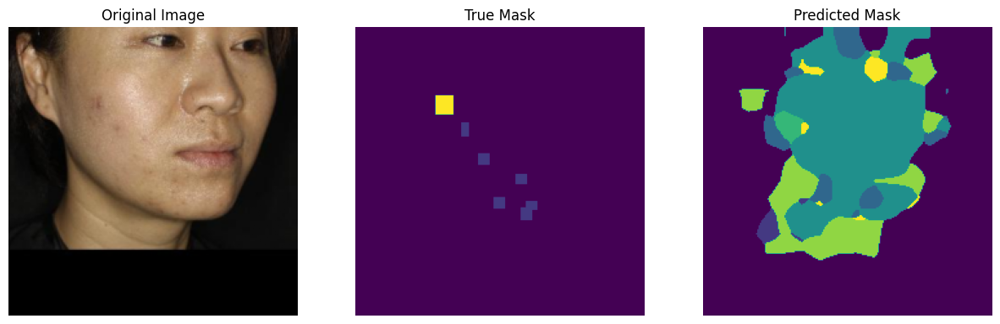

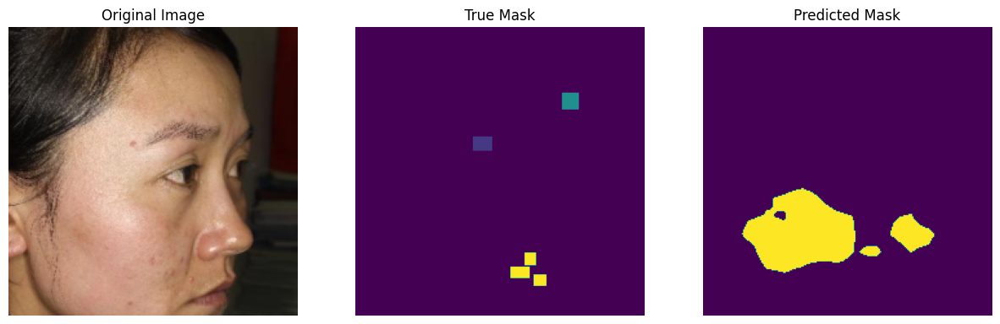


Epoch 22/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.66it/s]


train Loss: 1.5998 IoU: 0.1237


100%|██████████| 25/25 [00:02<00:00, 10.97it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 22


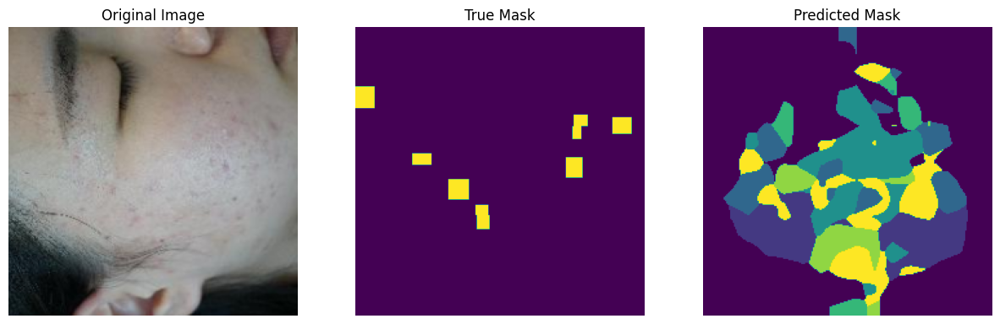

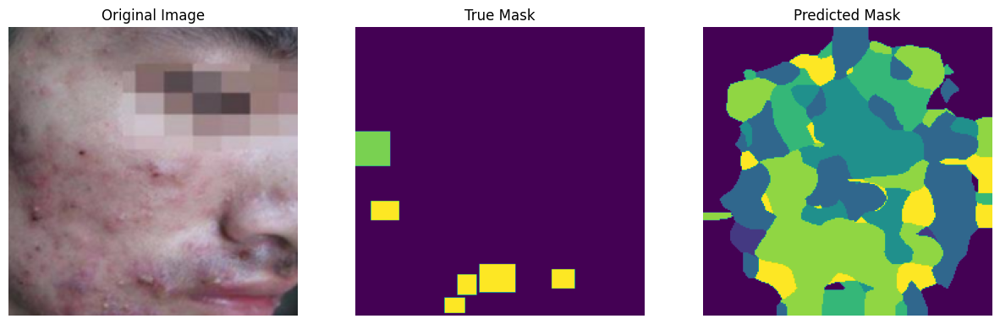


Epoch 23/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.58it/s]


train Loss: 1.5979 IoU: 0.1251


100%|██████████| 25/25 [00:02<00:00,  9.81it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 23


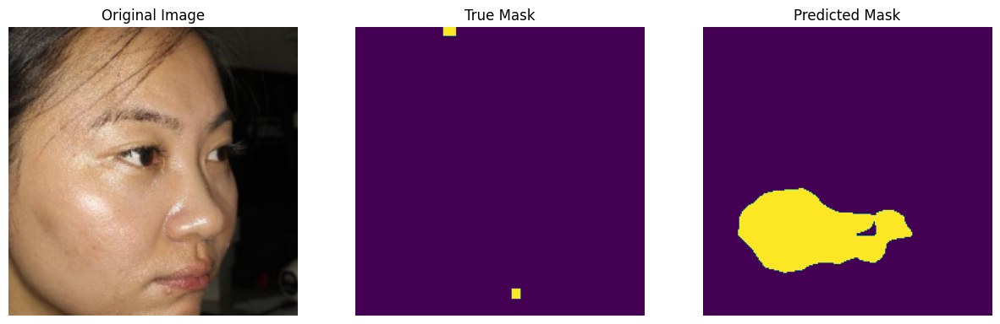

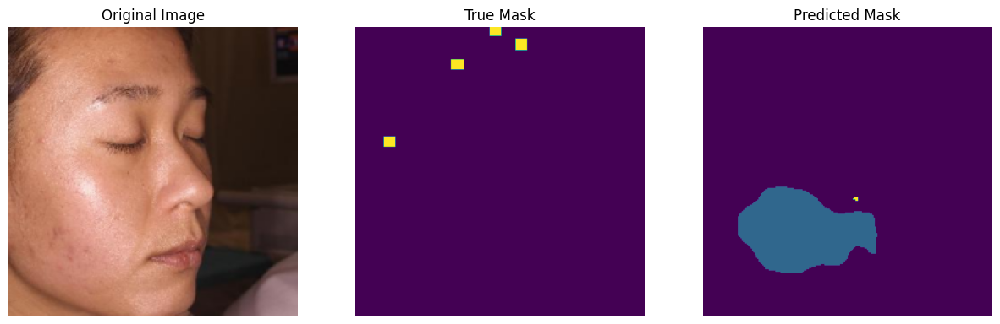


Epoch 24/24
----------


100%|██████████| 121/121 [00:18<00:00,  6.64it/s]


train Loss: 1.6027 IoU: 0.1246


100%|██████████| 25/25 [00:02<00:00, 10.15it/s]


val Loss: 1.5432 IoU: 0.1239
Visualizing predictions from epoch 24


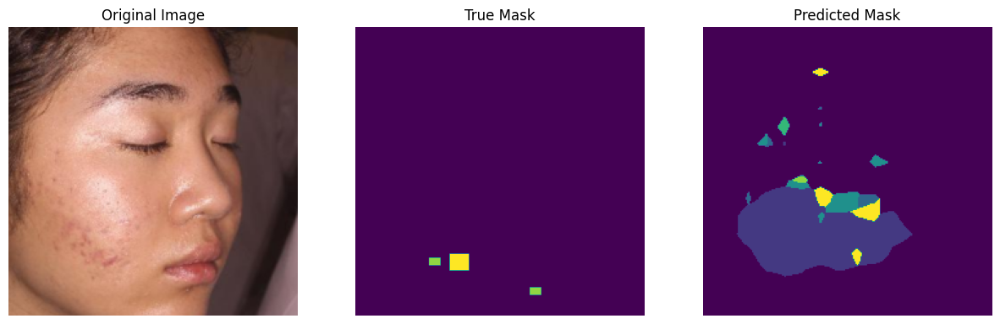

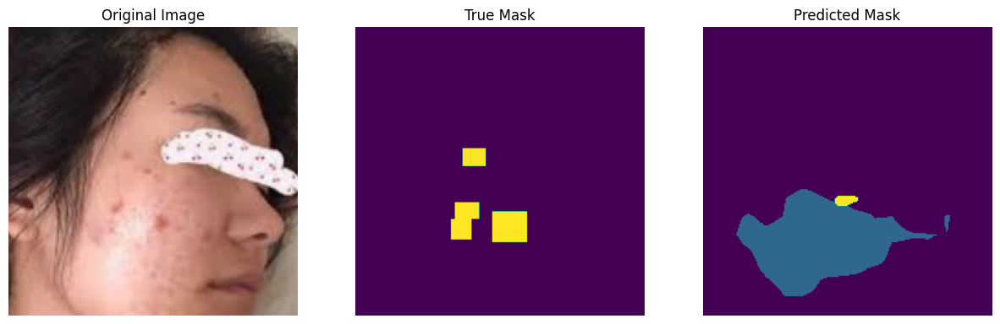


Best val Loss: 1.5432


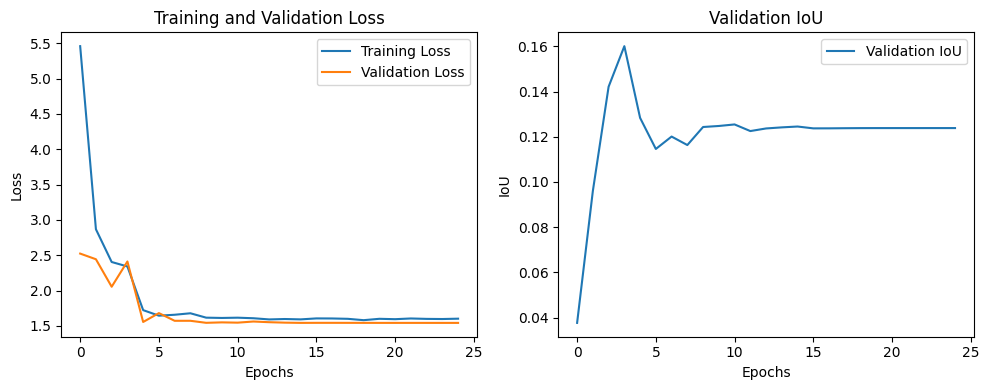

In [61]:
import torch
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from PIL import Image
import copy
from tqdm import tqdm
from sklearn.utils.class_weight import compute_class_weight
import numpy as np


import matplotlib.pyplot as plt

num_classes = 9  # Replace this with your actual number of classes
def iou(pred, target, n_classes = num_classes):
    ious = []
    pred = F.softmax(pred, dim=1)  # Apply softmax to the predictions
    pred = torch.argmax(pred, dim=1).squeeze(1)  # Get the predicted class labels
    for cls in range(n_classes):  # Iterate over each class
        pred_inds = pred == cls  # Find prediction for the current class
        target_inds = target == cls  # Find target for the current class
        intersection = (pred_inds[target_inds]).long().sum().item()  # Intersection of prediction and target
        union = pred_inds.long().sum().item() + target_inds.long().sum().item() - intersection  # Union of prediction and target
        if union == 0:
            ious.append(float('nan'))  # If there's no ground truth, do not include in evaluation
        else:
            ious.append(intersection / union)  # Calculate IoU
    return ious

import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt
from tqdm import tqdm
import copy

import random

def visualize_segmentation_results(model, dataset, device, num_images=10):
    model.eval()  # Set the model to evaluation mode
    images_handled = 0

    with torch.no_grad():  # No need to track gradients
        while images_handled < num_images:
            # Randomly select an index for visualization
            idx = random.randint(0, len(dataset) - 1)
            inputs, masks = dataset[idx]
            inputs.unsqueeze_(0)  # Add batch dimension
            masks.unsqueeze_(0)  # Add batch dimension

            inputs = inputs.to(device).float()  # Ensure inputs are float tensors
            masks = masks.to(device).long()  # Ensure masks are long tensors for comparison

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            inputs = inputs.cpu()
            masks = masks.cpu()
            preds = preds.cpu()

            plt.figure(figsize=(15, 5))
            # Original Image
            plt.subplot(1, 3, 1)
            plt.imshow(inputs[0].permute(1, 2, 0).numpy())
            plt.title('Original Image')
            plt.axis('off')

            # True Mask
            plt.subplot(1, 3, 2)
            plt.imshow(masks[0].squeeze().numpy())
            plt.title('True Mask')
            plt.axis('off')

            # Predicted Mask
            plt.subplot(1, 3, 3)
            plt.imshow(preds[0].squeeze().numpy())
            plt.title('Predicted Mask')
            plt.axis('off')

            plt.show()
            images_handled += 1


# Assuming num_classes is defined as the total number of classes in your dataset
def train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=10):
    best_model_wts = copy.deepcopy(model.state_dict())
    best_loss = float('inf')
    device = torch.device('cuda' if torch.cuda.is_available() else "cpu")
    model.to(device)

    train_loss_history = []
    val_loss_history = []
    val_iou_history = []

    for epoch in range(num_epochs):

        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        # Each epoch has a training and validation phase
        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()
            else:
                model.eval()

            running_loss = 0.0
            iou_scores_epoch = []  # List to store IoU scores for the epoch

            # Iterate over data.
            for inputs, masks in tqdm(dataloaders[phase]):
                inputs = inputs.to(device)
                masks = masks.to(device)

                optimizer.zero_grad()

                # Forward
                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    loss = criterion(outputs, masks)

                    # Backward + optimize only if in training phase
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                # Statistics
                running_loss += loss.item() * inputs.size(0)
                iou_scores_batch = iou(outputs, masks, n_classes=num_classes)
                iou_scores_epoch.extend(iou_scores_batch)  # Aggregate IoU scores

            epoch_loss = running_loss / len(dataloaders[phase].dataset)
            epoch_iou = torch.tensor([x for x in iou_scores_epoch if x == x]).mean()  # Mean IoU, ignoring NaNs

            print(f'{phase} Loss: {epoch_loss:.4f} IoU: {epoch_iou:.4f}')

            if phase == 'train':
                train_loss_history.append(epoch_loss)
                scheduler.step()
            else:
                val_loss_history.append(epoch_loss)
                val_iou_history.append(epoch_iou.item())

                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(model.state_dict())

        # Visualize some predictions at the end of the epoch
        if epoch % 1 == 0:  # Change to a higher number if you want less frequent visualization
            print(f'Visualizing predictions from epoch {epoch}')
            visualize_segmentation_results(model, val_dataset, device, num_images=2)

        print()

    print(f'Best val Loss: {best_loss:.4f}')

    # Load best model weights
    model.load_state_dict(best_model_wts)

    # Plot the training and validation loss, and IoU
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.plot(train_loss_history, label='Training Loss')
    plt.plot(val_loss_history, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(val_iou_history, label='Validation IoU')
    plt.title('Validation IoU')
    plt.xlabel('Epochs')
    plt.ylabel('IoU')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return model


device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

labels = ['background', 'dark spot', 'blackheads', 'whiteheads', 'nodules', 'pustules','papules']
# Definitions of criterion, optimizer, and scheduler remain the same
all_labels = [label for _, mask in dataloaders['train'] for label in mask.view(-1).tolist()]

# Compute the class weights
class_weights = compute_class_weight(
    class_weight='balanced',
    classes=np.unique(all_labels),
    y=all_labels  # This should be the flat list of all labels in the dataset
)


class_weights = torch.tensor(class_weights, dtype=torch.float).to(device)
print("CLASS WEIGHTS: ", class_weights)
class_weights[1:] *= 0.45 # Give less significance to non-background classes because otherwise model will overfit to minority classes

criterion = torch.nn.CrossEntropyLoss(weight=class_weights)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=4, gamma=0.1)

# Assuming dataloaders is defined and model is initialized
model = train_model(model, dataloaders, criterion, optimizer, scheduler, num_epochs=25)

torch.save(model.state_dict(), "model.pth")



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

import torch
from torchvision import transforms
from PIL import Image


def overlay_predicted_mask(model, image, device='cpu'):
    # Define the standard transformations
    transform = transforms.Compose([
        transforms.ToTensor(),
    ])

    # Preprocess the image
    image_tensor = transform(image).unsqueeze(0).to(device)

    # Make the prediction
    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        predicted_mask = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()

    # Overlay the predicted mask on the original image
    overlay_mask_on_image(np.array(image), predicted_mask, alpha=0.5)

def overlay_mask_on_image(image, mask_pred, alpha=0.5):
    """
    Overlay the predicted mask onto the image.

    Parameters:
    - image: the original image as a NumPy array.
    - mask_pred: the predicted mask as a NumPy array with class labels as pixel values.
    - alpha: the transparency level of the overlay.
    """

    # Define color map: each class label should have a corresponding RGBA color
    class_colors = {
        0: [0, 0, 0, 0],  # Assuming class '0' is background and should be transparent
        1: [255, 0, 0, alpha],  # Red with transparency `alpha`
        2: [0, 255, 0, alpha],  # Green with transparency `alpha`
        # Add colors for all your classes...
    }

    # Create an RGB image from the original image for display
    if image.ndim == 2 or (image.ndim == 3 and image.shape[2] == 1):  # if it's grayscale
        image_display = np.stack([image, image, image], axis=-1)
    else:
        image_display = image

    # Create an RGBA image for the overlay
    overlay = np.zeros((*mask_pred.shape, 4), dtype=np.uint8)

    # Populate the overlay with the corresponding class colors
    for class_label, color in class_colors.items():
        overlay[mask_pred == class_label] = color

    # Convert overlay and image to the same dtype for alpha blending
    overlay = overlay.astype(np.float32) / 255  # Normalize to [0, 1]
    image_display = image_display.astype(np.float32) / 255  # Normalize to [0, 1]

    # Alpha blending
    combined = (1 - alpha) * image_display + alpha * overlay

    # Display the image
    plt.figure(figsize=(10, 5))
    plt.imshow(combined)
    plt.axis('off')

    # Create legend
    legend_elements = [Patch(facecolor=np.array(color)/255.0, edgecolor='r', label=f'Class {label}') for label, color in class_colors.items() if label != 0]
    plt.legend(handles=legend_elements, loc='upper right')

    plt.show()
model.load_state_dict(torch.load("model.pth"))
image_n = 50
overlay_predicted_mask(model, val_dataset.image_paths[image_n])


In [ ]:
import torch
import matplotlib.pyplot as plt

def visualize_segmentation_results(model, dataloaders, num_images=10):
    model.eval()  # Set the model to evaluation mode
    images_handled = 0

    # Check if GPU is available
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    with torch.no_grad():  # No need to track gradients
        for inputs, masks in dataloaders['test']:
            inputs = inputs.to(device).float()  # Ensure inputs are float tensors
            masks = masks.to(device).long()  # Ensure masks are long tensors for comparison

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            # Move images and masks back to CPU for visualization if not on CPU already
            inputs = inputs.cpu()
            masks = masks.cpu()
            preds = preds.cpu()

            for i in range(inputs.size()[0]):
                images_handled += 1
                plt.figure(figsize=(20, 10))

                # Display original image
                ax = plt.subplot(1, 3, 1)
                ax.set_title('Original Image')
                plt.imshow(inputs[i].permute(1, 2, 0).numpy())
                plt.axis('off')

                # Display true mask
                ax = plt.subplot(1, 3, 2)
                ax.set_title('True Mask')
                plt.imshow(masks[i].squeeze().numpy())
                plt.axis('off')

                # Display predicted mask
                ax = plt.subplot(1, 3, 3)
                ax.set_title('Predicted Mask')
                plt.imshow(preds[i].squeeze().numpy())
                plt.axis('off')

                plt.show()

                if images_handled == num_images:
                    return  # Stop after displaying the desired number of images

# Assuming 'dataloaders' is a dictionary with 'test' dataloader defined
# Assuming 'model' is the trained segmentation model loaded with the trained weights

# Call the function
visualize_segmentation_results(model, dataloaders, num_images=10)
